## IBM Applied Data Science Capstone Project


In [1]:
!pip install folium
import urllib.request
from bs4 import BeautifulSoup
import pandas as pd
from geopy.geocoders import Nominatim
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
import json
import folium # map rendering library
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import numpy as np
import matplotlib.pyplot as plt

pd.set_option('display.max.columns',None)
pd.set_option('display.max.rows',None)

     |████████████████████████████████| 94 kB 4.9 MB/s  eta 0:00:01


In [373]:
import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_df408f04d85f4a17a23139d72883c778 = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='mLY2TkWZ5exlL_U3JwOP_QRQY4bthb7jVZ2eQl8PVrH_',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3-api.us-geo.objectstorage.service.networklayer.com')

body = client_df408f04d85f4a17a23139d72883c778.get_object(Bucket='courseracapstone-donotdelete-pr-icqijz7qifnj6i',Key='us-zip-code-latitude-and-longitude.json')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object 

if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

# Since JSON data can be semi-structured and contain additional metadata, it is possible that you might face an error during data loading.
# Please read the documentation of 'pandas.read_json()' and 'pandas.io.json.json_normalize' to learn more about the possibilities to adjust the data loading.
# pandas documentation: http://pandas.pydata.org/pandas-docs/stable/io.html#io-json-reader
# and http://pandas.pydata.org/pandas-docs/stable/generated/pandas.io.json.json_normalize.html

va_data = pd.read_json(body, orient='values')
va_data.head()


,datasetid,recordid,fields,geometry,record_timestamp
0,us-zip-code-latitude-and-longitude,5efac301ad69517f89cd99b0de55e829c1d0a28b,"{'city': 'Tappahannock', 'zip': '22560', 'dst'...","{'type': 'Point', 'coordinates': [-76.90656, 3...",2018-02-09T11:33:38.603-05:00
1,us-zip-code-latitude-and-longitude,9b178fa1ab305c24631d1f0af42308b09e38aa73,"{'city': 'Bridgewater', 'zip': '22812', 'dst':...","{'type': 'Point', 'coordinates': [-79.00071, 3...",2018-02-09T11:33:38.603-05:00
2,us-zip-code-latitude-and-longitude,13fc51f702d77962fadc06e7cbf5f3b3ea6a872b,"{'city': 'Haysi', 'zip': '24256', 'dst': 1, 'g...","{'type': 'Point', 'coordinates': [-82.29759, 3...",2018-02-09T11:33:38.603-05:00
3,us-zip-code-latitude-and-longitude,ee9171ab1d94531f6e3861ff2c649badc64ae0dd,"{'city': 'Stonega', 'zip': '24285', 'dst': 1, ...","{'type': 'Point', 'coordinates': [-82.79025, 3...",2018-02-09T11:33:38.603-05:00
4,us-zip-code-latitude-and-longitude,514e41e697d197fe13b93ac3b5861b471f78577f,"{'city': 'Fairfax', 'zip': '22034', 'dst': 1, ...","{'type': 'Point', 'coordinates': [-77.288755, ...",2018-02-09T11:33:38.603-05:00


In [374]:
column_names = ['ZIP','Area','Latitude','Longitude']

df_zip = pd.DataFrame(columns=column_names)

In [375]:
#scrape json file for relevant data

count=0
while count<len(va_data):
    for data in va_data:
        zipcode = va_data['fields'][count]['zip']
        area = va_data['fields'][count]['city']
        zip_lat = va_data['fields'][count]['latitude']
        zip_lon = va_data['fields'][count]['longitude']
    
        df_zip = df_zip.append({'ZIP':zipcode,'Area':area,'Latitude':zip_lat,'Longitude':zip_lon},ignore_index=True)
        
        count = count+1

In [376]:
address = 'Fairfax, Virginia'
geolocator = Nominatim(user_agent="va_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Fairfax, VA are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Fairfax, VA are 38.8462236, -77.3063733.


In [377]:
df_zip.ZIP = df_zip.ZIP.astype(int)

zip_remove = ['20130','20184','20185','20115','20116','20188','20186','20187','20139','22002','20128','20106','20138','20119','20137','20198','20140','20144']

nova = df_zip[df_zip['ZIP']<22350].reset_index(drop=True)
nova = nova[~nova['ZIP'].isin(zip_remove)]


In [378]:
map_va = folium.Map(location=[latitude, longitude], zoom_start=10)
for lat, lng, city, zipcode in zip(nova['Latitude'], nova['Longitude'], nova['Area'],nova['ZIP']):
    label = '{}, {}'.format(city,zipcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_va)
    

In [379]:
map_va

In [380]:
CLIENT_ID = 'LNS0SVHQN1T2LTT4LITR5GMCDJCQEVWRFO1TNOMS3U5U34OB' # your Foursquare ID
CLIENT_SECRET = 'DKFTZWCK3RMXJANUWXA24ISM0UJLYDAF14MN0CYO5XI3TF0D' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 500 # A default Foursquare API limit value

print('Credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Credentials:
CLIENT_ID: LNS0SVHQN1T2LTT4LITR5GMCDJCQEVWRFO1TNOMS3U5U34OB
CLIENT_SECRET:DKFTZWCK3RMXJANUWXA24ISM0UJLYDAF14MN0CYO5XI3TF0D


In [381]:
zip_lat2 = nova.loc[0,'Latitude']
zip_lon2 = nova.loc[0,'Longitude']
zip_city = nova.loc[0,'Area']

print('Latitude and longitude values of {} are {}, {}.'.format(zip_city, 
                                                               zip_lat2, 
                                                               zip_lon2))



Latitude and longitude values of Fairfax are 38.831813, -77.288755.


In [382]:
LIMIT = 200 # limit of number of venues returned by Foursquare API
radius = 10000 # define radius
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    zip_lat2, 
    zip_lon2, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=LNS0SVHQN1T2LTT4LITR5GMCDJCQEVWRFO1TNOMS3U5U34OB&client_secret=DKFTZWCK3RMXJANUWXA24ISM0UJLYDAF14MN0CYO5XI3TF0D&v=20180605&ll=38.831813,-77.288755&radius=10000&limit=200'

In [383]:
def getNearbyVenues(names, latitudes, longitudes, radius=5000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue

        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['ZIP', 
                  'Area Latitude', 
                  'Area Longitude',
                  'Venue',
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category',]
    
    return(nearby_venues)

In [16]:
nova_venues_7k = getNearbyVenues(names=nova['ZIP'],latitudes=nova['Latitude'],longitudes=nova['Longitude'],radius=7000)

In [390]:
nova_venues = nova_venues_7k

nova_venues_food = nova_venues[nova_venues['Venue Category'].isin(['Korean Restaurant','Chinese Restaurant','Asian Restaurant','Vietnamese Restaurant','Thai Restaurant','Japanese Restaurant','Sushi Restaurant','Bubble Tea Shop','Noodle House','Ramen Restaurant','Filipino Restaurant','Hotpot Restaurant','Szechuan Restaurant','Taiwanese Restaurant','Himalayan Restaurant','Shabu-Shabu Restaurant','Dim Sum Restaurant',])]

print("Total number of venues retrieved: \n{}\n".format(nova_venues['Venue Category'].value_counts().sum()))
print("Total number of venues selected for analysis: \n{}\n".format(nova_venues_food['Venue Category'].value_counts().sum()))

Total number of venues retrieved: 
16968

Total number of venues selected for analysis: 
1557



In [391]:
nova_venues_food.head()

,ZIP,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
9,22034,38.831813,-77.288755,Sushi Prince,38.845545,-77.301178,Sushi Restaurant
17,22034,38.831813,-77.288755,East Wind,38.846177,-77.306011,Vietnamese Restaurant
20,22034,38.831813,-77.288755,Izakaya Blueocean,38.842322,-77.270775,Sushi Restaurant
32,22034,38.831813,-77.288755,99°C Hot Pot,38.844133,-77.291212,Asian Restaurant
36,22034,38.831813,-77.288755,Sisters Thai The Living Room Cafe,38.845737,-77.305500,Thai Restaurant


In [392]:
#one hot encoding
nova_onehot = pd.get_dummies(nova_venues_food[['Venue Category']],prefix='',prefix_sep='')

#add area column back to dataframe
nova_onehot['ZIP'] = nova_venues_food['ZIP']

#move area column to the first column
fixed_columns = [nova_onehot.columns[-1]]+ list(nova_onehot.columns[:-1])
nova_onehot = nova_onehot[fixed_columns]


In [393]:
nova_onehot['ZIP'].nunique()

178

In [394]:
nova_grouped = nova_onehot.groupby('ZIP').sum().reset_index()

columns = ['ZIP','Count']
nova_heat_korean = pd.DataFrame(columns = columns)

nova_heat_korean['ZIP'] = nova_grouped['ZIP']
nova_heat_korean['Count'] = nova_grouped['Korean Restaurant']

In [395]:
nova_grouped2 = nova_grouped

In [396]:
nova_grouped2.set_index('ZIP',inplace=True)

In [397]:
nova_grouped2['Counts'] = nova_grouped2.sum(axis=1)

In [398]:
nova_grouped2.reset_index(inplace=True)

In [399]:
columns = ['ZIP','Counts']
nova_heat_all = pd.DataFrame(columns = columns)

nova_heat_all['ZIP'] = nova_grouped2['ZIP']
nova_heat_all['Counts'] = nova_grouped2['Counts']

In [400]:
num_top_venues = 5
nova_grouped = nova_onehot.groupby('ZIP').mean().reset_index()

for hood in nova_grouped['ZIP']:
    print(hood)
    temp = nova_grouped[nova_grouped['ZIP'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')


20101
                 venue  freq
0     Asian Restaurant   0.5
1      Thai Restaurant   0.5
2      Bubble Tea Shop   0.0
3   Chinese Restaurant   0.0
4  Filipino Restaurant   0.0


20103
                venue  freq
0    Asian Restaurant  0.33
1    Sushi Restaurant  0.33
2     Thai Restaurant  0.33
3     Bubble Tea Shop  0.00
4  Chinese Restaurant  0.00


20105
                 venue  freq
0     Asian Restaurant  0.33
1  Japanese Restaurant  0.33
2      Thai Restaurant  0.33
3      Bubble Tea Shop  0.00
4   Chinese Restaurant  0.00


20107
                venue  freq
0    Sushi Restaurant   0.5
1     Thai Restaurant   0.5
2    Asian Restaurant   0.0
3     Bubble Tea Shop   0.0
4  Chinese Restaurant   0.0


20108
                   venue  freq
0        Thai Restaurant  0.36
1           Noodle House  0.18
2       Sushi Restaurant  0.18
3  Vietnamese Restaurant  0.18
4    Filipino Restaurant  0.09


20109
                   venue  freq
0        Thai Restaurant  0.43
1  Vietnamese Restaura

                   venue  freq
0        Thai Restaurant  0.38
1        Bubble Tea Shop  0.25
2  Vietnamese Restaurant  0.25
3       Sushi Restaurant  0.12
4       Asian Restaurant  0.00


22030
                   venue  freq
0       Sushi Restaurant  0.25
1        Thai Restaurant  0.25
2  Vietnamese Restaurant  0.25
3       Asian Restaurant  0.12
4        Bubble Tea Shop  0.12


22031
                    venue  freq
0        Sushi Restaurant  0.33
1        Asian Restaurant  0.11
2       Hotpot Restaurant  0.11
3       Korean Restaurant  0.11
4  Shabu-Shabu Restaurant  0.11


22032
                   venue  freq
0       Sushi Restaurant  0.29
1        Thai Restaurant  0.21
2       Asian Restaurant  0.14
3  Vietnamese Restaurant  0.14
4     Chinese Restaurant  0.07


22033
                 venue  freq
0  Japanese Restaurant   0.4
1     Asian Restaurant   0.2
2   Chinese Restaurant   0.2
3    Korean Restaurant   0.2
4      Bubble Tea Shop   0.0


22034
                   venue  freq
0    

                   venue  freq
0       Sushi Restaurant  0.20
1        Thai Restaurant  0.20
2  Vietnamese Restaurant  0.20
3       Asian Restaurant  0.07
4        Bubble Tea Shop  0.07


22185
                   venue  freq
0       Sushi Restaurant  0.20
1        Thai Restaurant  0.20
2  Vietnamese Restaurant  0.20
3       Asian Restaurant  0.07
4        Bubble Tea Shop  0.07


22191
                 venue  freq
0     Sushi Restaurant   1.0
1     Asian Restaurant   0.0
2      Bubble Tea Shop   0.0
3   Chinese Restaurant   0.0
4  Filipino Restaurant   0.0


22192
                venue  freq
0  Chinese Restaurant  0.33
1    Sushi Restaurant  0.33
2     Thai Restaurant  0.33
3    Asian Restaurant  0.00
4     Bubble Tea Shop  0.00


22193
                 venue  freq
0  Japanese Restaurant  0.33
1     Sushi Restaurant  0.33
2      Thai Restaurant  0.33
3     Asian Restaurant  0.00
4      Bubble Tea Shop  0.00


22194
                 venue  freq
0      Thai Restaurant  0.33
1         Nood

                   venue  freq
0    Japanese Restaurant  0.22
1       Sushi Restaurant  0.22
2        Thai Restaurant  0.22
3  Vietnamese Restaurant  0.22
4     Chinese Restaurant  0.11


22333
                   venue  freq
0        Thai Restaurant  0.25
1  Vietnamese Restaurant  0.25
2       Asian Restaurant  0.12
3    Japanese Restaurant  0.12
4       Ramen Restaurant  0.12


22334
                   venue  freq
0        Thai Restaurant  0.25
1  Vietnamese Restaurant  0.25
2       Asian Restaurant  0.12
3    Japanese Restaurant  0.12
4       Ramen Restaurant  0.12


22336
                   venue  freq
0        Thai Restaurant  0.25
1  Vietnamese Restaurant  0.25
2       Asian Restaurant  0.12
3    Japanese Restaurant  0.12
4       Ramen Restaurant  0.12




In [401]:
nova_venues_food['Venue Category'].value_counts()

Thai Restaurant           376
Sushi Restaurant          228
Vietnamese Restaurant     224
Chinese Restaurant        127
Asian Restaurant          114
Korean Restaurant         108
Bubble Tea Shop            96
Japanese Restaurant        81
Noodle House               52
Filipino Restaurant        40
Hotpot Restaurant          37
Shabu-Shabu Restaurant     36
Szechuan Restaurant        27
Ramen Restaurant           11
Name: Venue Category, dtype: int64

Text(0.5, 0, 'Venue Category')

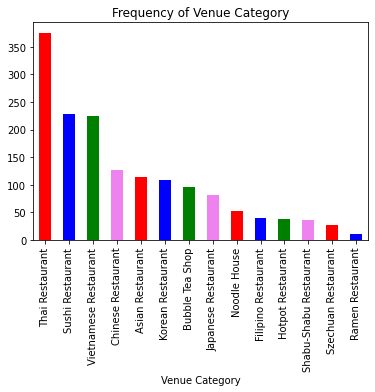

In [402]:
nova_bar = nova_venues_food['Venue Category'].value_counts()

fig = plt.figure()
ax = fig.add_subplot()
nova_bar.plot.bar('variable','value',color=['red','blue','green','violet'],legend=None,title='Frequency of Venue Category',ax=fig.gca())
ax.set_xlabel('Venue Category')



In [403]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [404]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['ZIP']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
nova_venues_sorted = pd.DataFrame(columns=columns)
nova_venues_sorted['ZIP'] = nova_grouped['ZIP']

for ind in np.arange(nova_grouped.shape[0]):
    nova_venues_sorted.iloc[ind, 1:] = return_most_common_venues(nova_grouped.iloc[ind, :], num_top_venues)

nova_venues_sorted.head()

,ZIP,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,20101,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
1,20103,Thai Restaurant,Sushi Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
2,20105,Thai Restaurant,Japanese Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
3,20107,Thai Restaurant,Sushi Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant,Hotpot Restaurant
4,20108,Thai Restaurant,Vietnamese Restaurant,Sushi Restaurant,Noodle House,Filipino Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Korean Restaurant,Japanese Restaurant


In [405]:
!wget --quiet https://github.com/jalbertbowden/open-virginia-gis/raw/master/zip-codes/json/zt51_d00.geojson
va_geo = r'zt51_d00.geojson'

In [406]:
nova_all_map = folium.Map(location=[latitude, longitude], zoom_start=11)
nova_all_map.choropleth(
    geo_data=va_geo,
    data=nova_heat_all,
    columns=['ZIP', 'Counts'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of Asian Restaurants',
    reset=True
)
nova_all_map

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/folium/folium.py:413: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [407]:
nova_korean_map = folium.Map(location=[latitude, longitude], zoom_start=11)
nova_korean_map.choropleth(
    geo_data=va_geo,
    data=nova_heat_korean,
    columns=['ZIP', 'Count'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of Korean Restaurants',
    reset=True
)
nova_korean_map

In [408]:
# set number of clusters
kclusters = 6

nova_grouped_clustering = nova_grouped.drop('ZIP', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(nova_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_



array([0, 0, 0, 2, 3, 3, 3, 3, 3, 3, 5, 5, 1, 1, 2, 1, 4, 0, 0, 2, 0, 0,
       4, 2, 2, 1, 2, 2, 4, 3, 0, 0, 0, 3, 1, 0, 3, 4, 0, 1, 2, 1, 4, 0,
       2, 3, 2, 2, 0, 3, 2, 2, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2,
       4, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 3, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 4, 3, 2, 1, 3, 2, 2, 2, 2, 2, 1,
       4, 2, 2, 2, 2, 2, 2, 5, 2, 2, 3, 3, 2, 3, 3, 3, 3, 2, 3, 3, 2, 3,
       0, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3,
       2, 3, 2, 3, 2, 2, 2, 3, 2, 3, 2, 2, 2, 1, 2, 2, 3, 2, 2, 2, 2, 2,
       2, 2], dtype=int32)

In [409]:
# add clustering labels
nova_venues_sorted.insert(0, 'Cluster_Labels', kmeans.labels_)

In [410]:
nova_merged = nova

# merge nova_grouped with nova_data to add latitude/longitude for each area
nova_merged.reset_index()
nova_merged = nova_merged.join(nova_venues_sorted.set_index('ZIP'), on='ZIP')

nova_merged["Cluster_Labels"].value_counts()



2.0    89
3.0    47
0.0    17
1.0    14
4.0     8
5.0     3
Name: Cluster_Labels, dtype: int64

In [411]:
nova_merged_dropna = nova_merged.dropna()

In [412]:
nova_merged_dropna.Cluster_Labels = nova_merged_dropna.Cluster_Labels.astype(int)

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [427]:
nova_merged_dropna.head()

,ZIP,Area,Latitude,Longitude,Cluster_Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,22034,Fairfax,38.831813,-77.288755,2,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant
1,22315,Alexandria,38.757924,-77.152840,3,Thai Restaurant,Sushi Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House
2,22203,Arlington,38.874979,-77.114550,3,Thai Restaurant,Szechuan Restaurant,Noodle House,Japanese Restaurant,Filipino Restaurant,Chinese Restaurant,Vietnamese Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant
5,22191,Woodbridge,38.632750,-77.267860,5,Sushi Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant,Hotpot Restaurant
7,22081,Merrifield,38.873861,-77.234454,2,Thai Restaurant,Sushi Restaurant,Vietnamese Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Bubble Tea Shop,Szechuan Restaurant,Ramen Restaurant,Noodle House


In [413]:
from folium import plugins

map_nova = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, zc in zip(nova_merged_dropna['Latitude'], nova_merged_dropna['Longitude'], nova_merged_dropna['Area'], nova_merged_dropna['Cluster_Labels'],nova_merged_dropna['ZIP']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + ', ' + str(zc),parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=7,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_nova)
    
map_nova


In [414]:
#Cluster 0
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==0,nova_merged_dropna.columns[[0] +[1] + list(range(5, nova_merged_dropna.shape[1]))]]

,ZIP,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
17,20158,Hamilton,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
23,20141,Round Hill,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
27,20170,Herndon,Vietnamese Restaurant,Thai Restaurant,Asian Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
53,20142,Round Hill,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
67,20103,Dulles,Thai Restaurant,Sushi Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
75,20105,Aldie,Thai Restaurant,Japanese Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
79,20160,Lincoln,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
98,20159,Hamilton,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
104,20134,Purcellville,Thai Restaurant,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
120,20190,Reston,Thai Restaurant,Vietnamese Restaurant,Japanese Restaurant,Asian Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant


In [415]:
#Cluster 1
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==1,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]

,ZIP,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,22161,Springfield,Korean Restaurant,Chinese Restaurant,Asian Restaurant,Bubble Tea Shop,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant
38,22151,Springfield,Korean Restaurant,Chinese Restaurant,Asian Restaurant,Thai Restaurant,Bubble Tea Shop,Vietnamese Restaurant,Sushi Restaurant,Noodle House,Szechuan Restaurant,Shabu-Shabu Restaurant
43,22121,Mount Vernon,Korean Restaurant,Japanese Restaurant,Vietnamese Restaurant,Bubble Tea Shop,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House
55,22066,Great Falls,Vietnamese Restaurant,Thai Restaurant,Korean Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Japanese Restaurant,Hotpot Restaurant
56,22033,Fairfax,Japanese Restaurant,Korean Restaurant,Chinese Restaurant,Asian Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant
59,20165,Sterling,Thai Restaurant,Vietnamese Restaurant,Korean Restaurant,Japanese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant
73,22312,Alexandria,Asian Restaurant,Korean Restaurant,Thai Restaurant,Vietnamese Restaurant,Chinese Restaurant,Sushi Restaurant,Filipino Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant
84,20171,Herndon,Vietnamese Restaurant,Japanese Restaurant,Asian Restaurant,Thai Restaurant,Korean Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House
87,20124,Clifton,Korean Restaurant,Thai Restaurant,Noodle House,Japanese Restaurant,Hotpot Restaurant,Bubble Tea Shop,Vietnamese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant
108,20120,Centreville,Korean Restaurant,Vietnamese Restaurant,Japanese Restaurant,Thai Restaurant,Szechuan Restaurant,Bubble Tea Shop,Asian Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant


In [416]:
#Cluster 2
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==2,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]

,ZIP,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,22034,Fairfax,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant
7,22081,Merrifield,Thai Restaurant,Sushi Restaurant,Vietnamese Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Bubble Tea Shop,Szechuan Restaurant,Ramen Restaurant,Noodle House
10,20147,Ashburn,Thai Restaurant,Sushi Restaurant,Japanese Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Hotpot Restaurant
15,22156,Springfield,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant
19,22092,Herndon,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant
20,20196,Reston,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant
21,22095,Herndon,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant,Hotpot Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Szechuan Restaurant
22,22153,Springfield,Thai Restaurant,Sushi Restaurant,Japanese Restaurant,Filipino Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant
26,22046,Falls Church,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Bubble Tea Shop,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
28,22305,Alexandria,Thai Restaurant,Sushi Restaurant,Japanese Restaurant,Vietnamese Restaurant,Ramen Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Noodle House,Korean Restaurant,Hotpot Restaurant


In [417]:
#Cluster 3
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==3,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]

,ZIP,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,22315,Alexandria,Thai Restaurant,Sushi Restaurant,Chinese Restaurant,Bubble Tea Shop,Asian Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House
2,22203,Arlington,Thai Restaurant,Szechuan Restaurant,Noodle House,Japanese Restaurant,Filipino Restaurant,Chinese Restaurant,Vietnamese Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant
14,20112,Manassas,Noodle House,Filipino Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Korean Restaurant,Japanese Restaurant
18,22135,Quantico,Thai Restaurant,Noodle House,Vietnamese Restaurant,Sushi Restaurant,Korean Restaurant,Filipino Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Japanese Restaurant
25,22207,Arlington,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Noodle House,Japanese Restaurant,Vietnamese Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Korean Restaurant,Hotpot Restaurant
31,22204,Arlington,Thai Restaurant,Vietnamese Restaurant,Ramen Restaurant,Noodle House,Filipino Restaurant,Chinese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Korean Restaurant
37,22201,Arlington,Thai Restaurant,Szechuan Restaurant,Noodle House,Asian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Korean Restaurant,Japanese Restaurant
39,22306,Alexandria,Thai Restaurant,Vietnamese Restaurant,Chinese Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
44,22302,Alexandria,Thai Restaurant,Japanese Restaurant,Vietnamese Restaurant,Sushi Restaurant,Ramen Restaurant,Filipino Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Noodle House,Korean Restaurant
46,22215,Arlington,Thai Restaurant,Vietnamese Restaurant,Szechuan Restaurant,Noodle House,Japanese Restaurant,Filipino Restaurant,Chinese Restaurant,Bubble Tea Shop,Sushi Restaurant,Shabu-Shabu Restaurant


In [418]:
#Cluster 4
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==4,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]

,ZIP,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,20155,Gainesville,Japanese Restaurant,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
13,22036,Fairfax,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
16,20143,Catharpin,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant
24,20169,Haymarket,Japanese Restaurant,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
167,22134,Quantico,Japanese Restaurant,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
179,20176,Leesburg,Japanese Restaurant,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
185,22172,Triangle,Japanese Restaurant,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant
199,20129,Paeonian Springs,Japanese Restaurant,Chinese Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Sushi Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant


In [419]:
#Cluster 5
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==5,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]

,ZIP,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,22191,Woodbridge,Sushi Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant,Hotpot Restaurant
8,20117,Middleburg,Sushi Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant,Hotpot Restaurant
64,20118,Middleburg,Sushi Restaurant,Vietnamese Restaurant,Thai Restaurant,Szechuan Restaurant,Shabu-Shabu Restaurant,Ramen Restaurant,Noodle House,Korean Restaurant,Japanese Restaurant,Hotpot Restaurant


In [420]:
#Cluster 0
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==0,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]['1st Most Common Venue'].value_counts()

Thai Restaurant          14
Vietnamese Restaurant     2
Asian Restaurant          1
Name: 1st Most Common Venue, dtype: int64

In [421]:
#Cluster 1
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==1,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]['1st Most Common Venue'].value_counts()

Korean Restaurant        8
Vietnamese Restaurant    3
Japanese Restaurant      1
Thai Restaurant          1
Asian Restaurant         1
Name: 1st Most Common Venue, dtype: int64

In [422]:
#Cluster 2
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==2,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]['1st Most Common Venue'].value_counts()

Vietnamese Restaurant    50
Thai Restaurant          21
Sushi Restaurant         15
Chinese Restaurant        3
Name: 1st Most Common Venue, dtype: int64

In [423]:
#Cluster 3
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==3,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]['1st Most Common Venue'].value_counts()

Thai Restaurant       45
Noodle House           1
Chinese Restaurant     1
Name: 1st Most Common Venue, dtype: int64

In [424]:
#Cluster 4
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==4,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]['1st Most Common Venue'].value_counts()

Japanese Restaurant    6
Chinese Restaurant     2
Name: 1st Most Common Venue, dtype: int64

In [425]:
#Cluster 5
nova_merged_dropna.loc[nova_merged_dropna['Cluster_Labels']==5,nova_merged_dropna.columns[[0]+[1] + list(range(5, nova_merged_dropna.shape[1]))]]['1st Most Common Venue'].value_counts()

Sushi Restaurant    3
Name: 1st Most Common Venue, dtype: int64